# toolbox.plot

<div class="alert alert-block alert-info">
View interactive version on <a href="https://nbviewer.org/github/janjoch/toolbox/blob/main/demo/toolbox.plot.ipynb">NBViewer</a>!
</div>

### Import section

In [1]:
import sys

sys.path.insert(0, r"..")

import toolbox as tb

In [2]:
import datetime as dt

import numpy as np

import matplotlib.pyplot as plt

import pandas as pd

In [3]:
import plotly.offline
plotly.offline.init_notebook_mode()

### Enhance a function

In [5]:
@tb.plot.magic_plot
def plot(*xy, fig=None, **kwargs):
    fig.add_line(*xy, **kwargs)

In [6]:
plot([0,4,6,7], [1,2,4,8])

D:\Code\toolbox\demo\..\toolbox\plot.py:286: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



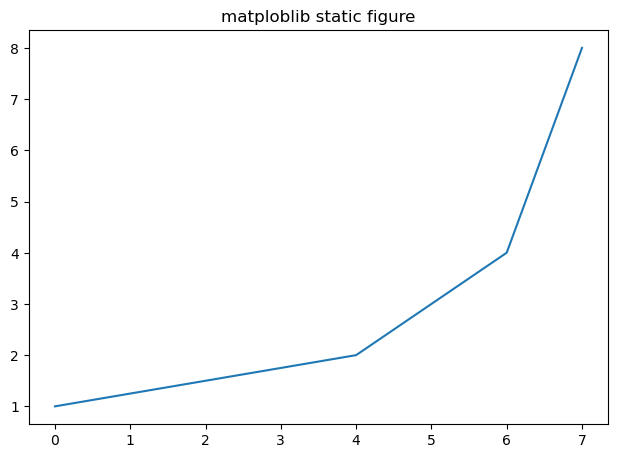

In [6]:
plot([0,4,6,7], [1,2,4,8], interactive=False, title="matploblib static figure")

In [7]:
# function must accept the keyword argument add_trace
# the only thing the function has to do, is to call add_trace
@tb.plot.magic_plot
def plot_lines(samples=100, n=10, label="sigma={0}, mu={1}", fig=None):
    """
    Plot a line!

    Parameters
    ----------
    samples: int, optional
        Default 100
    n: int, optional
        Number of traces.
        Default: 10
    label: str, optional
        Trace label. May contain {0} for sigma and {1} for mu values.
        Default: "sigma={0}, mu={1}"
    [decorator parameters will be added automatically]
    """
    for i in range(1, n+1):
        fig.add_line(np.random.normal(i*10,i,samples), label=label.format(i, i*10))

In [8]:
# function now accepts their own arguments,
# and plot-styling arguments
plot_lines(samples=200, title="Normally distributed Noise")

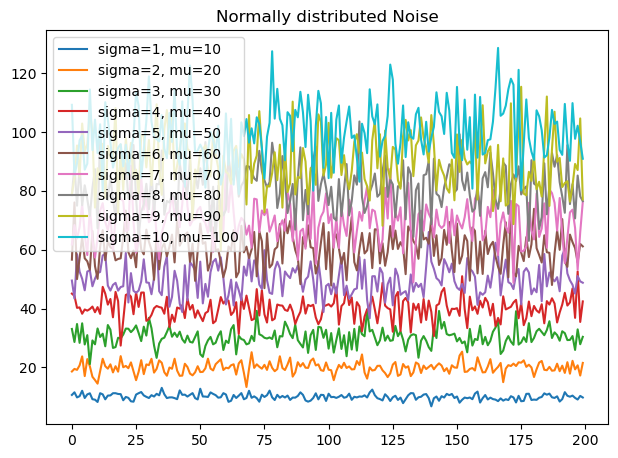

In [9]:
# function now accepts their own arguments,
# and plot-styling arguments
plot_lines(samples=200, interactive=False, title="Normally distributed Noise")

In [10]:
@tb.plot.magic_plot
def plot_hists(samples=100, n=10, label="sigma={0}, mu={1}", fig=None, **kwargs):
    """
    Plot a line!

    Parameters
    ----------
    x_max: int, optional
    [decorator parameters]
    """
    for i in range(1, n+1):
        fig.add_hist(np.random.normal(i*10,i,samples), label=label.format(i, i*10), **kwargs)

In [11]:
plot_hists(samples=10000, title="It really is normally distrubuted!")

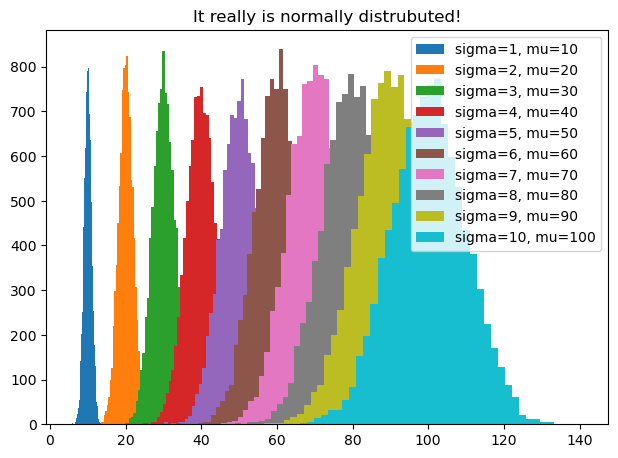

In [12]:
plot_hists(samples=10000, interactive=False, title="It really is normally distrubuted!", bins=40)

### Enhance class methods

In [2]:
import sys

sys.path.insert(0, r"..")

import toolbox as tb

In [3]:
import datetime as dt

import numpy as np

import matplotlib.pyplot as plt

import pandas as pd

In [4]:
import plotly.offline
plotly.offline.init_notebook_mode()

In [13]:
class SignalAnalysis(tb.plot.NotebookInteraction):
    """A generic example to import (aka simulate) and show data easily."""

    def __init__(self, samples=1000):
        # read or simulate your data
        self.data = np.random.normal(0,1,samples)
        self.index = pd.date_range(dt.datetime.now() - dt.timedelta(seconds=samples), dt.datetime.now(), samples)

    @tb.plot.magic_plot
    def plot(self, fig, **kwargs):
        """
        Show this beauty of a graph!

        Parameters
        ----------
        [decorator parameters will be added automatically]
        """
        fig.add_line(self.index, self.data, **kwargs)

    @tb.plot.magic_plot
    def hist(self, fig, **kwargs):
        """
        Show this beauty of a histogram!

        Parameters
        ----------
        [decorator parameters will be added automatically]
        """
        fig.add_hist(self.data, **kwargs)

    @tb.plot.magic_plot
    def combined(self, fig, **kwargs):
        """
        Show this beauty of a histogram!

        Parameters
        ----------
        [decorator parameters will be added automatically]
        """
        fig.add_line(self.data, **kwargs)
        fig.add_hist(y=self.data, **kwargs)
    
    @tb.plot.magic_plot_preset(interactive=False)
    def plot_static(self, fig, **kwargs):
        """
        Show this beauty of a graph! STATIC, however!

        Parameters
        ----------
        [decorator parameters will be added automatically]
        """
        fig.add_line(self.index, self.data, **kwargs)

    @tb.plot.magic_plot_preset(interactive=True)
    def plot_interactive(self, fig, **kwargs):
        """
        Show this beauty of a graph! STATIC, however!

        Parameters
        ----------
        [decorator parameters will be added automatically]
        """
        fig.add_line(self.index, self.data, **kwargs)

    @tb.plot.magic_plot_preset(title="A beautiful chart :D", xlabel="You cannot change the x label, can you?")
    def plot_preset(self, fig, **kwargs):
        """
        Show this beauty of a graph! Already preset for you!

        Parameters
        ----------
        [decorator parameters will be added automatically]
        """
        fig.add_line(self.index, self.data, **kwargs)


In [20]:
import plotly.express as px

import xarray as xr

In [39]:
class PlotCombi(tb.plot.Plot):

    def __init__(self):
        # super().__init__(interactive=True)
        self.interactive = True
        self.count = 0
        self.array = xr.DataArray(np.random.normal(0,1,(100,100)))
        self.fig = px.imshow(self.array)

In [46]:
plot_combi = PlotCombi()

In [47]:
plot_combi.add_line(np.random.normal(50, 30, 100))

In [52]:
plot_combi.add_line(y=np.random.normal(50, 30, 100))

TypeError: add_line() missing 1 required positional argument: 'x'

In [51]:
plot_combi.fig

In [14]:
# The tb.plot.NotebookInteraction parent class allows initialisation and automatic display with one line
SignalAnalysis()

D:\Code\toolbox\demo\..\toolbox\plot.py:284: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



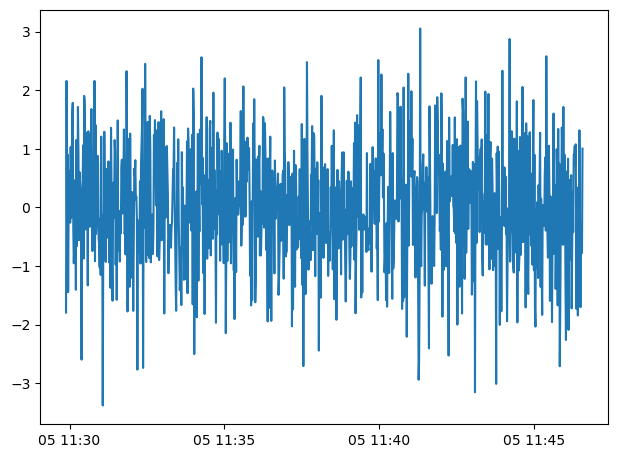

In [15]:
SignalAnalysis().plot_static()

In [16]:
# for more functionality, keep the instsance...
signal = SignalAnalysis()

In [17]:
signal.plot_preset()

In [10]:
signal.plot?

In [11]:
signal.plot_preset?

In [12]:
signal.combined()

In [13]:
DOCSTRING_DECORATOR = """
    interactive: bool, optional
        Display an interactive plotly line plot
        instead of the default matplotlib figure.
        Default: False
    title: str, optional
        Plot title.
        Default: None
    xlabel, ylabel: str, optional
        Axis labels.
        Default: None
    fig_size: tuple of 2x float, optional
        Default: None
        PLOTLY: dimensions in px.
        MATPLOTLIB: dimensions in inch.
    xlim, ylim: tuple of 2 numbers, optional
        Axis range limits.
    legend_loc: str, optional
        MATPLOTLIB ONLY.
        Default:
            In case of 1 line: None
            In case of >1 line: "best" (auto-detect)
    legend_title: str, optional
        Default: None
    pty_update_layout: dict, optional
         PLOTLY ONLY.
        Pass keyword arguments to plotly's
        fig.update_layout(**pty_update_layout)
        Thus, take full control over
        Default: None
    pty_custom_func: function, optional
        PLOTLY ONLY.
        Pass a function reference to further style the plotly graphs.
        Function must accept fig and return fig.
        Example:
        >>> def pty_custom_func(fig):
        >>>     fig.do_stuff()
        >>>     return fig
        Default: None
    mpl_custom_func: function, optional
        MATPLOTLIB ONLY.
        Pass a function reference to further style the matplotlib graphs.
        Function must accept fig, ax and return fig, ax.
        Example:
        >>> def mpl_custom_func(fig, ax):
        >>>     fig.do_stuff()
        >>>     ax.do_more()
        >>>     return fig, ax
        Default: None"""


In [17]:
import re

In [58]:
EASY_DOCSTRING = """
    a: A
        BLA A
    b, c: BC
        BLA BC
    d, e, f: DEF
        BLA DEF"""

In [116]:
def filter_docstring(doc_decorator, **kwargs_remove):
    # find indentation level of doc_decorator
    match = re.match("^\n?(?P<indent_core>[ \t]*)", doc_decorator)
    indent_decorator = match.group("indent_core") if match else ""
    print(indent_decorator)

    # remove kwargs from doc_decorator
    for kwarg_key in kwargs_remove:

        # remove docstring entry if it is the only argument
        doc_decorator = re.sub(
            (
                r"\n{0}"  # indent
                r"{1}[ ]*:"  # kwarg_key followed by colon
                r".*(?:\n{0}[ \t]+.*)"  # the following further indented lines
            ).format(
                indent_decorator,
                kwarg_key,
            ),
            r"",
            doc_decorator,
        )

        # remove docstring key if it is found in a list
        doc_decorator = re.sub(
            (
                (  # preceding kwarg_key
                    r"(?P<front>"  # named group
                    # r"\n{0}(?:[a-zA-Z_]+(?:[ ]*,[ ]*)?)*?
                    r"\n{0}"  # indentation
                    r"(?:[a-zA-Z_]+)??"  # first arg
                    r"(?:[ ]*,[ ]*[a-zA-Z_]+)??"  # following args
                    r")"  # end named group
                ) +
                (  # kwarg_key
                    r"(?P<leading_coma>[ ]*,[ ]*)?"  # leading coma
                    r"{1}"  # kwarg_key
                    r"(?(leading_coma)|(?:[ ]*,[ ]*)?)"  # following coma if no leading coma
                ) +
                r"(?P<back>(?:[ ]*,[ ]*[a-zA-Z_]+)*[ ]*?)"  # following arguments
            ).format(indent_decorator, kwarg_key),
            r"\g<front>\g<back>",
            doc_decorator,
        )
        print("removed", kwarg_key)
    return doc_decorator

In [118]:
print(filter_docstring(EASY_DOCSTRING))

    

    a: A
        BLA A
    b, c: BC
        BLA BC
    d, e, f: DEF
        BLA DEF


In [ ]:
# works, but with wrong comas...
            doc_decorator = re.sub(
                (
                    r"(?P<front>\n{0}(?:[a-zA-Z_]+(?:[ ]*,[ ]*)?)*?)"
                    r"{1}(?:[ ]*,[ ]*)?"
                    r"(?P<back>(?:[ ]*,[ ]*[a-zA-Z_]+)*[ ]*?)"
                ).format(indent_decorator, kwarg_key),
                r"\g<front>\g<back>",
                doc_decorator,
            )


In [14]:
signal.plot?

In [15]:
signal.plot_static?

In [20]:
import functools

In [21]:
functools.wraps?

In [20]:
# raw, user-configurable plot
signal.plot(title="plotly backend (default)")

D:\Code\toolbox\demo\..\toolbox\plot.py:286: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



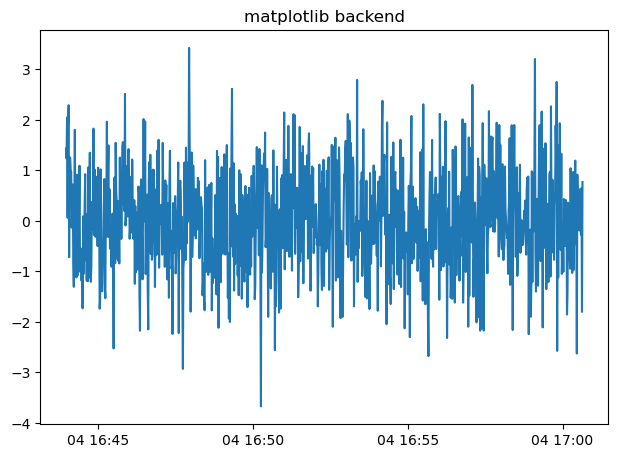

In [21]:
# raw, user-configurable plot
signal.plot(interactive=False, title="matplotlib backend")

In [22]:
# show default annotated plot
signal.show()

AttributeError: 'SignalAnalysis' object has no attribute 'show'

In [ ]:
signal.hist?

In [ ]:
# automatic html representation with _repr_html_()
signal

In [ ]:
# histogram
signal.hist(color="black", bins=40)

In [ ]:
signal.hist(color="black", bins=40, interactive=False)

In [ ]:
# control all of plotly by passing keyword argumends for plotly's fig.update_layout
signal.hist(
    title="Fully controllable layout!",
    pty_update_layout=dict(plot_bgcolor="black")
)

In [ ]:
# take even more control with the custom function
def pty_custom_func(fig):
    fig.update_traces(opacity=0.75)
    return fig

signal.hist(
    title="custom function",
    pty_custom_func=pty_custom_func,
)

In [ ]:
# take even more control with the custom function
def mpl_custom_func(fig, ax):
    ax.set_axisbelow(True)
    ax.text(0, 50, "custsom annotation,\nyay!",
        horizontalalignment="center",
        verticalalignment="center",
        color="white",
    )
    ax.grid(linestyle="--", zorder=10)
    return fig, ax

signal.hist(
    title="custom function",
    bins=20,
    fig_size=(10,5),
    interactive=False,
    mpl_custom_func=mpl_custom_func,
    save_fig="exports/custom_matplotlib.png",
)

In [ ]:
# save plot
signal.show(save_fig="exports/signal_plotly.html")
signal.show(interactive=False, save_fig="exports/signal_mpl.png")
signal.show(save_fig="exports/signal_plotly.png")
plt.close()